In [ ]:
# -*- coding: utf-8 -*-
#
#  Copyright 2024 Technical University of Denmark
#  Authored by: Piotr Budzisz (DTU)
#
#  Licensed under the Apache License, Version 2.0 (the "License");
#  you may not use this file except in compliance with the License.
#  You may obtain a copy of the License at
#
#      http://www.apache.org/licenses/LICENSE-2.0
#
#  Unless required by applicable law or agreed to in writing, software
#  distributed under the License is distributed on an "AS IS" BASIS,
#  WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
#  See the License for the specific language governing permissions and
#  limitations under the License.
#
#  The dataset and files mentioned in the notebook belong to the CFU (Center for Fast Ultrasound Imaging) at DTU (Technical University of Denmark).
#
#  Note: The following code has been created for the purpose of a master's thesis by Piotr Budzisz titled
#  "Computational reduction of reconstruction artifacts in stitching-based biomedical computed tomography,"
#  written at the Technical University of Denmark. The file is based on and reuses parts and descriptions
#  from the Core Imaging Library notebooks created by :
#
#                   Jakob S. Jørgensen (DTU)
#                   Gemma Fardell (UKRI-STFC)
#                   Laura Murgatroyd (UKRI-STFC)
#
#  which can be found in the GitHub repository (https://github.com/TomographicImaging/CIL-Demos).
#  Copyright 2021 - 2022 United Kingdom Research and Innovation
#  Copyright 2021 - 2022 The University of Manchester
#  Copyright 2021 - 2022 Technical University of Denmark
#

In [1]:
# Import all CIL components needed
from cil.framework import ImageData, ImageGeometry
from cil.framework import AcquisitionGeometry, AcquisitionData

# CIL Processors
from cil.processors import CentreOfRotationCorrector, Slicer, TransmissionAbsorptionConverter, Normaliser, Padder

# CIL display tools
from cil.utilities.display import show2D, show_geometry

# CIL FBP
#from cil.recon import FBP
from cil.plugins.astra.processors import FBP
# From CIL ASTRA plugin
from cil.plugins.astra import ProjectionOperator

# All external imports
import numpy as np
import matplotlib.pyplot as plt
import scipy.io
import os

In [2]:
from skimage import color, io, measure, img_as_ubyte

In [3]:
import logging
logging.basicConfig(level=logging.WARNING)
cil_log_level = logging.getLogger('cil.processors')
cil_log_level.setLevel(logging.INFO)

In [4]:
device = 'gpu'

In [5]:
datapath = "/dtu/cfu/data/userdata18/s220464/storage/KIDNEY_DATA"

filename_1 = "slice5_1023_data.mat"  
filename_2 = "slice6_1023_data.mat"  
filename_3 = "slice1_1023_data.mat"  
filename_4 = "slice2_1023_data.mat"  

all_data_1 = scipy.io.loadmat(os.path.join(datapath,filename_1))
all_data_2 = scipy.io.loadmat(os.path.join(datapath,filename_2))
all_data_3 = scipy.io.loadmat(os.path.join(datapath,filename_3))
all_data_4 = scipy.io.loadmat(os.path.join(datapath,filename_4))

In [6]:
projs_1 = all_data_1['X_proj'].astype(np.float32)
projs_2 = all_data_2['X_proj'].astype(np.float32)
projs_3 = all_data_3['X_proj'].astype(np.float32)
projs_4 = all_data_4['X_proj'].astype(np.float32)

In [7]:
ag = AcquisitionGeometry.create_Parallel2D()  \
         .set_panel(num_pixels=(2048))        \
         .set_angles(angles=np.linspace(0,180,1800,endpoint=False))

In [8]:
ag.set_labels(['horizontal', 'angle'])

In [9]:
ig = ag.get_ImageGeometry()

In [10]:
ag.set_labels(['horizontal', 'angle'])
data_1 = AcquisitionData(projs_1, geometry=ag, deep_copy=False)
data_1.reorder('astra')
fbp = FBP(ig, ag, device)
recon_fbp_1 = fbp(data_1)

In [11]:
ag.set_labels(['horizontal', 'angle'])
data_2 = AcquisitionData(projs_2, geometry=ag, deep_copy=False)
data_2.reorder('astra')
fbp = FBP(ig, ag, device)
recon_fbp_2 = fbp(data_2)

In [12]:
ag.set_labels(['horizontal', 'angle'])
data_3 = AcquisitionData(projs_3, geometry=ag, deep_copy=False)
data_3.reorder('astra')
fbp = FBP(ig, ag, device)
recon_fbp_3 = fbp(data_3)

In [13]:
ag.set_labels(['horizontal', 'angle'])
data_4 = AcquisitionData(projs_4, geometry=ag, deep_copy=False)
data_4.reorder('astra')
fbp = FBP(ig, ag, device)
recon_fbp_4 = fbp(data_4)

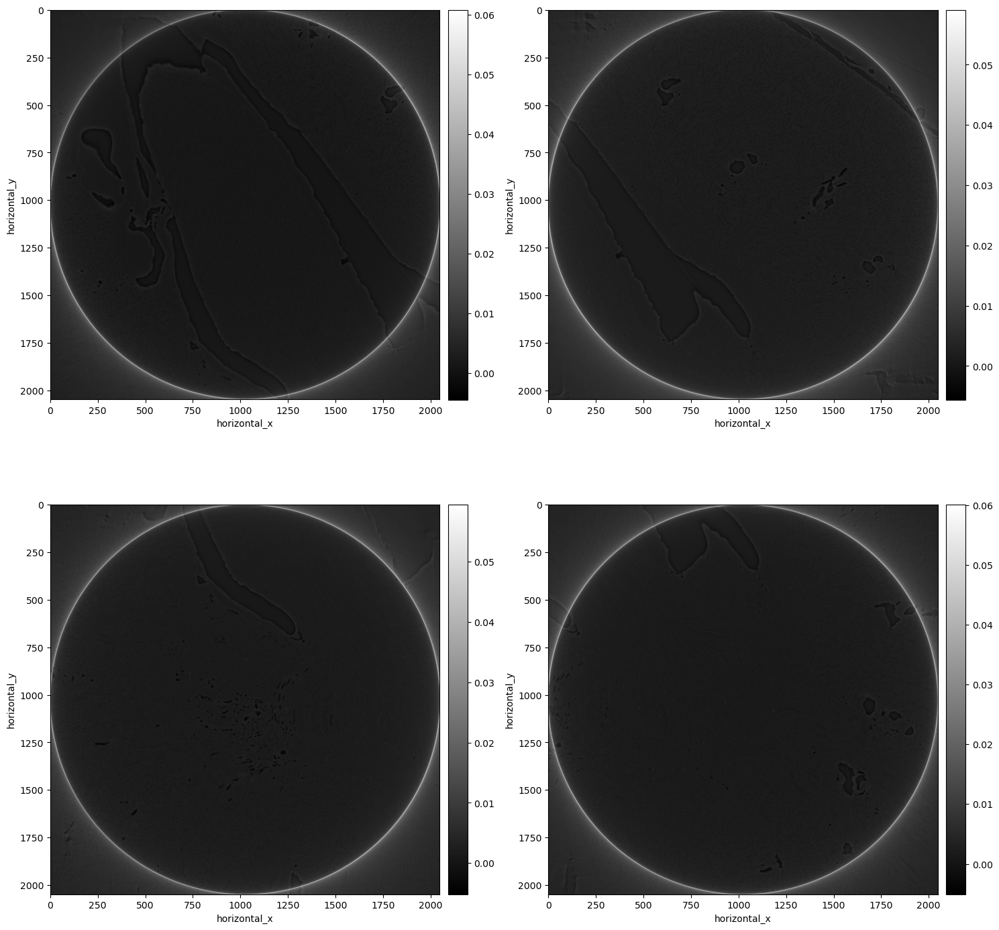

In [14]:
show2D([recon_fbp_1, recon_fbp_3, recon_fbp_2, recon_fbp_4], origin="upper-left")

In [15]:
ig = ag.get_ImageGeometry()

In [16]:
# CIL Processors
from cil.processors import CentreOfRotationCorrector, Slicer, TransmissionAbsorptionConverter, Normaliser, Padder

padsize = 512
data_pad_1 = Padder.edge(pad_width={'horizontal': padsize})(data_1)
data_pad_2 = Padder.edge(pad_width={'horizontal': padsize})(data_2)
data_pad_3 = Padder.edge(pad_width={'horizontal': padsize})(data_3)
data_pad_4 = Padder.edge(pad_width={'horizontal': padsize})(data_4)

In [17]:
data_pad_1.reorder('astra')
data_pad_2.reorder('astra')
data_pad_3.reorder('astra')
data_pad_4.reorder('astra')

In [18]:
ag_pad = data_pad_1.geometry

In [19]:
fbp = FBP(ig, ag_pad, device)
recon_fbp_1 = fbp(data_pad_1)
recon_fbp_2 = fbp(data_pad_2)
recon_fbp_3 = fbp(data_pad_3)
recon_fbp_4 = fbp(data_pad_4)

In [20]:
# apply circle mask 
from numpy import arange, meshgrid, isscalar, ndarray, pi, roll
offset = 0

siz = 2048
if siz % 2:
    rang = arange(-siz / 2 + 1, siz / 2 + 1)
else:
    rang = arange(-siz / 2,siz / 2)
x,y = meshgrid(rang,rang)
z = x ** 2 + y ** 2
a = (z < (siz / 2 - abs(offset)) ** 2)

In [21]:
recon_fbp_1 = recon_fbp_1 * a
recon_fbp_2 = recon_fbp_2 * a
recon_fbp_3 = recon_fbp_3 * a
recon_fbp_4 = recon_fbp_4 * a

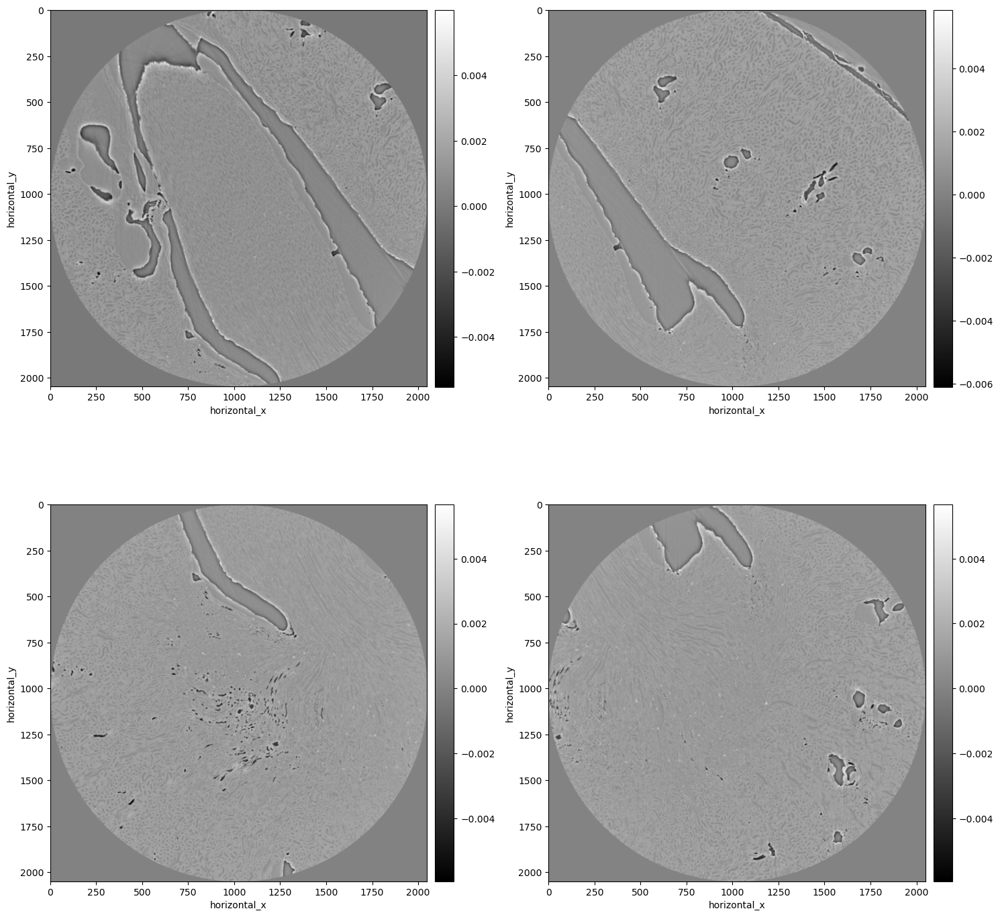

In [22]:
show2D([recon_fbp_1, recon_fbp_3, recon_fbp_2, recon_fbp_4], origin="upper-left")

## FBP approach

In [23]:
# Offset X : 555.25*0.0016 = 0.8884   Y : 711.5*0.0016 = 1.1384

#number of pixels
pixel_size = 0.0016 #mm
n_pixels_X = 3158.5
n_pixels_Y = 3471
n_pixels_detector = 2048

ag = AcquisitionGeometry.create_Parallel2D(detector_position=[0,5])  \
         .set_panel(n_pixels_detector, pixel_size=0.0016)      \
         .set_angles(angles=np.linspace(0,180,1800,endpoint=False))

ig = ImageGeometry(voxel_num_x=3158.5, 
                   voxel_num_y=3471, 
                   voxel_size_x=0.0016, 
                   voxel_size_y=0.0016)

ig_2048 = ImageGeometry(voxel_num_x=2048, 
                   voxel_num_y=2048, 
                   voxel_size_x=0.0016, 
                   voxel_size_y=0.0016)

ig_1 = ImageGeometry(voxel_num_x = 3158.5,
                     voxel_num_y = 3471,
                     voxel_size_x = 0.0016,
                     voxel_size_y = 0.0016,
                     center_x = 555.25 * ig.voxel_size_x,
                     center_y = 711.5 * ig.voxel_size_y)

ig_2 = ImageGeometry(voxel_num_x = 3158.5,
                     voxel_num_y = 3471,
                     voxel_size_x = 0.0016,
                     voxel_size_y = 0.0016,
                     center_x = 555.25 * ig.voxel_size_x,
                     center_y = -711.5 * ig.voxel_size_y)

ig_3 = ImageGeometry(voxel_num_x = 3158.5,
                     voxel_num_y = 3471,
                     voxel_size_x = 0.0016,
                     voxel_size_y = 0.0016,
                     center_x = -555.25 * ig.voxel_size_x,
                     center_y = 711.5 * ig.voxel_size_y)

ig_4 = ImageGeometry(voxel_num_x = 3158.5,
                     voxel_num_y = 3471,
                     voxel_size_x = 0.0016,
                     voxel_size_y = 0.0016,
                     center_x = -555.25 * ig.voxel_size_x,
                     center_y = -711.5 * ig.voxel_size_y)

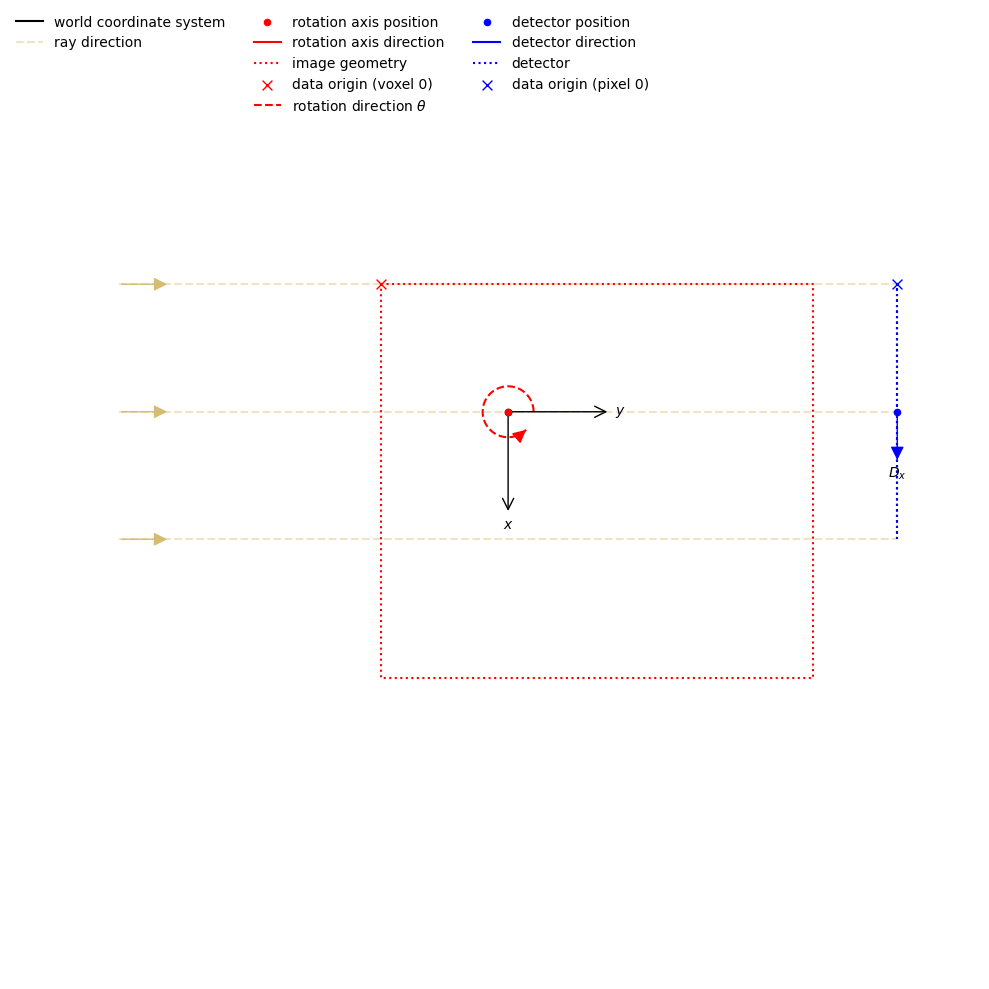

In [24]:
show_geometry(ag, ig_1)

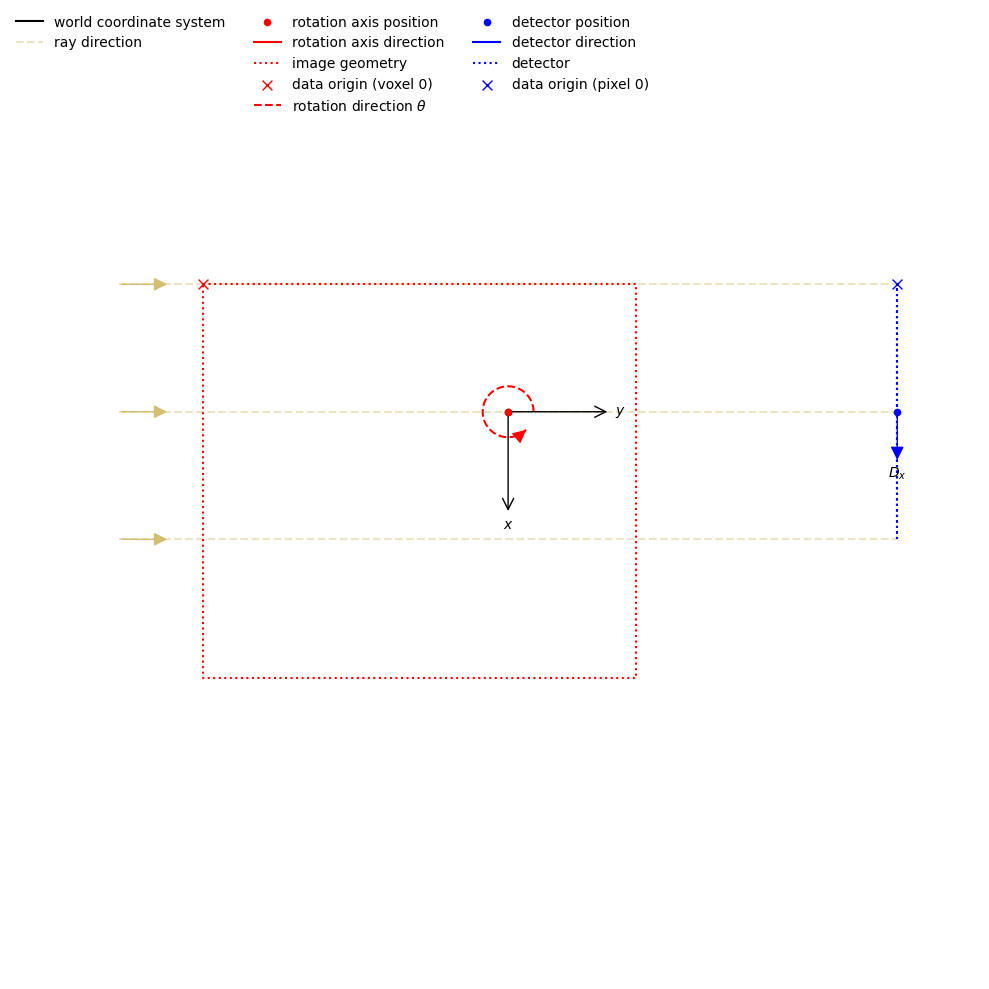

In [25]:
show_geometry(ag, ig_2)

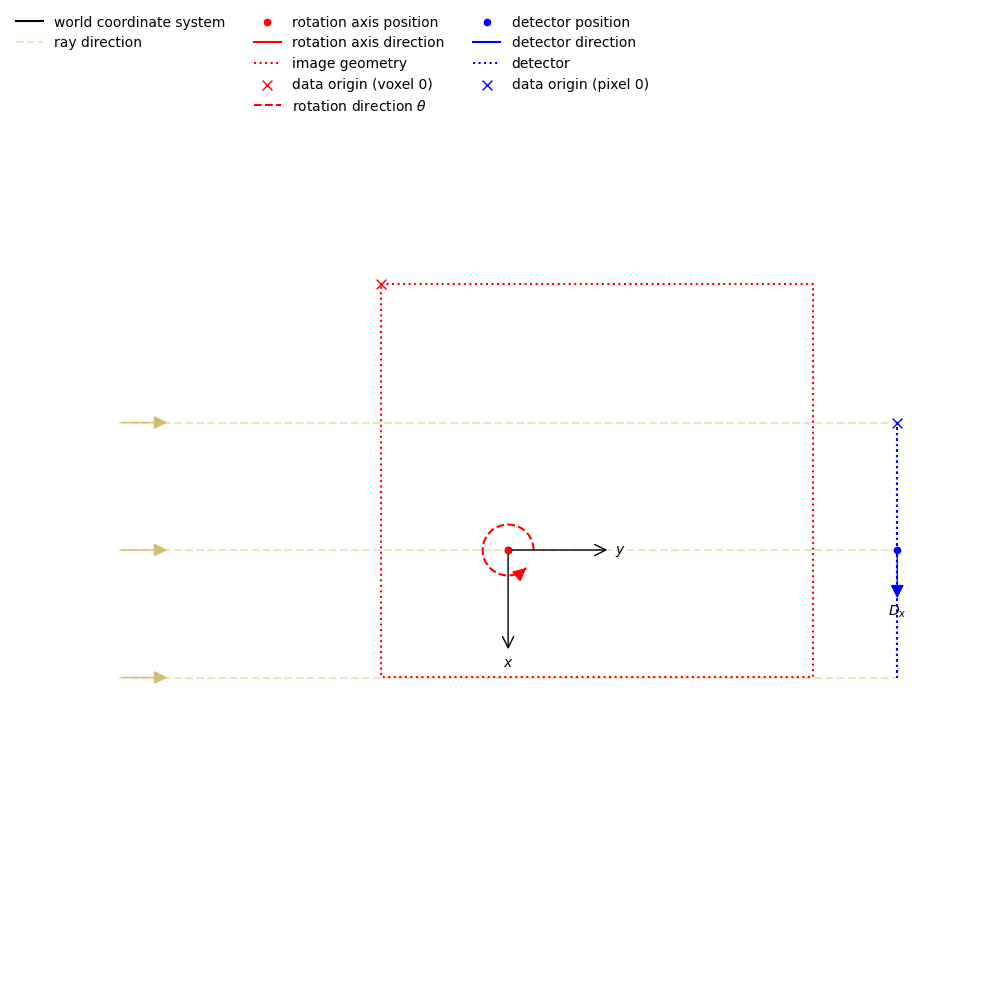

In [26]:
show_geometry(ag, ig_3)

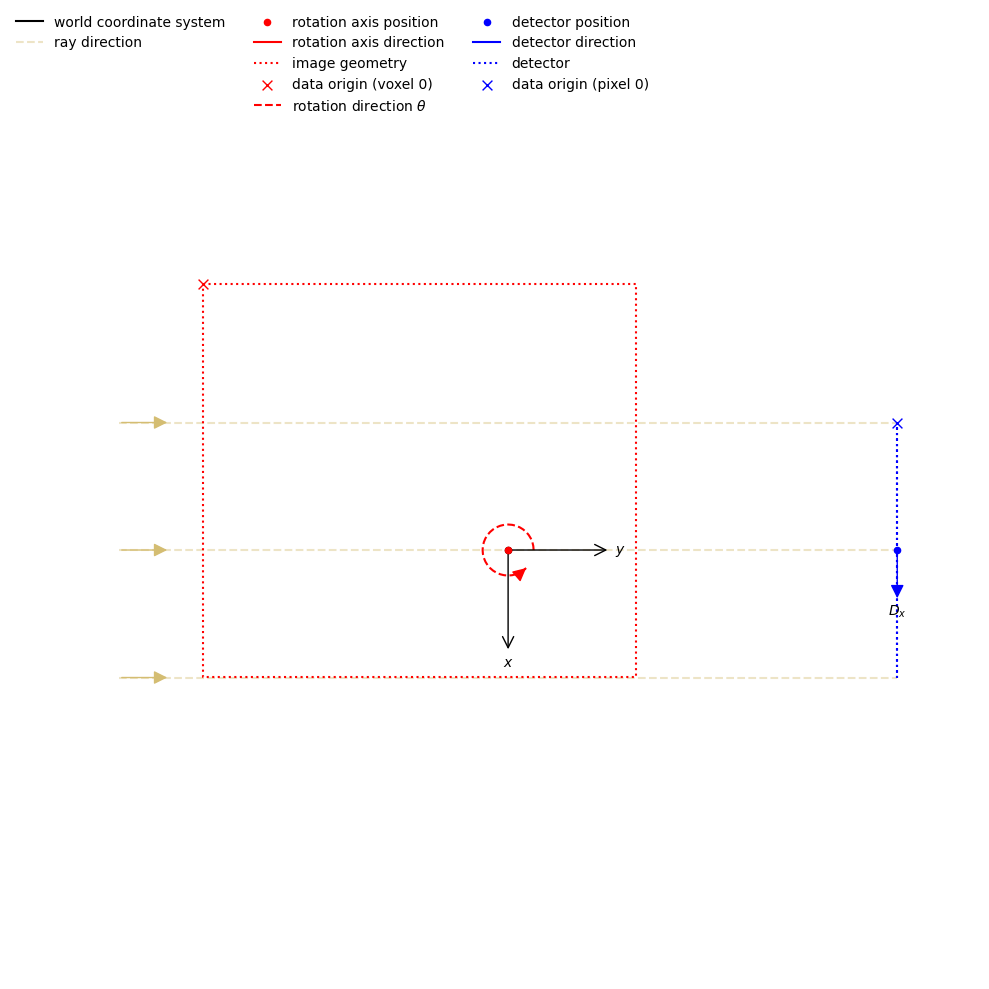

In [27]:
show_geometry(ag, ig_4)

In [28]:
fbp = FBP(ig_1, ag, device)
recon_fbp_1 = fbp(data_1)
fbp = FBP(ig_2, ag, device)
recon_fbp_2 = fbp(data_2)
fbp = FBP(ig_3, ag, device)
recon_fbp_3 = fbp(data_3)
fbp = FBP(ig_4, ag, device)
recon_fbp_4 = fbp(data_4)

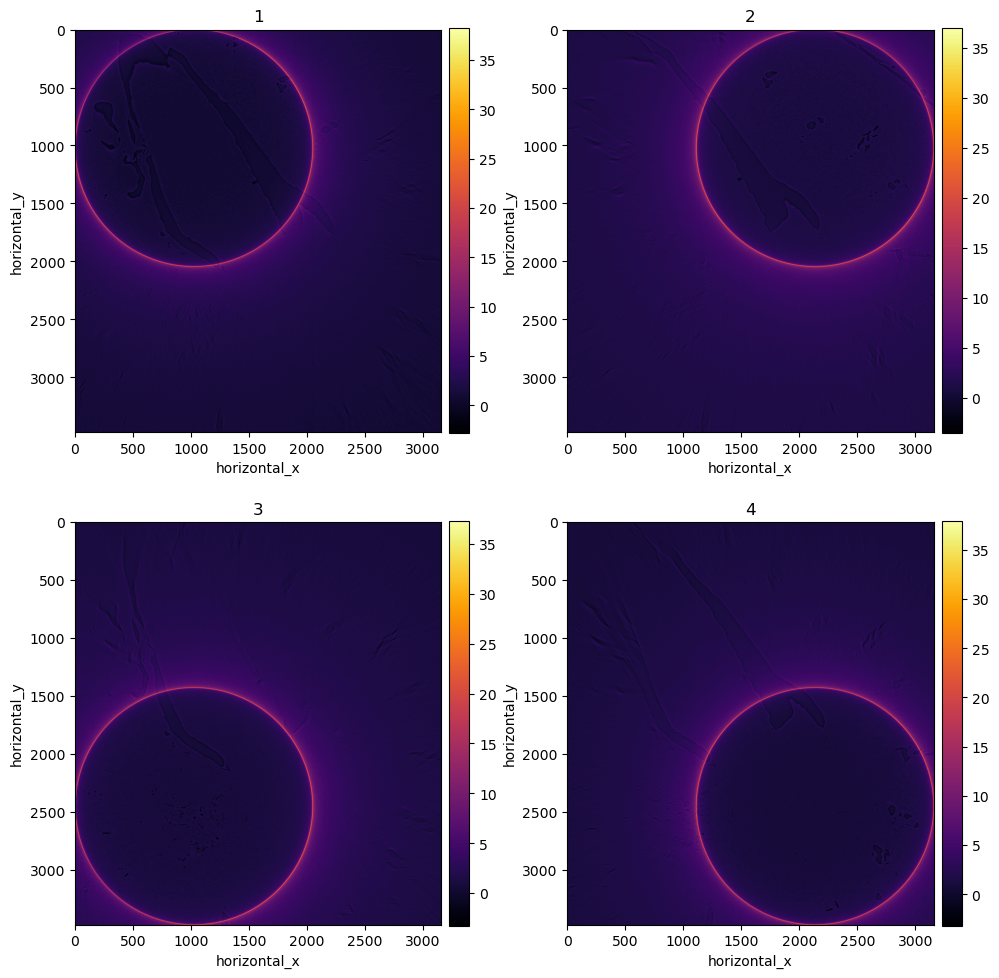

In [29]:
show2D([recon_fbp_1, recon_fbp_3, recon_fbp_2, recon_fbp_4], ['1', '2', '3', '4'], \
       cmap='inferno', num_cols=2, size=(10,10), origin='upper-left')

# padding and projecting on smaller 2048x2048 grid

In [30]:
from cil.processors import CentreOfRotationCorrector, Slicer, TransmissionAbsorptionConverter, Normaliser, Padder
padsize = 512
sino_1_pad = Padder.edge(pad_width={'horizontal': padsize})(data_1)
sino_2_pad = Padder.edge(pad_width={'horizontal': padsize})(data_2)
sino_3_pad = Padder.edge(pad_width={'horizontal': padsize})(data_3)
sino_4_pad = Padder.edge(pad_width={'horizontal': padsize})(data_4)

In [31]:
ag_pad = AcquisitionGeometry.create_Parallel2D(detector_position=[0,5])  \
         .set_panel(3072, pixel_size=0.0016)      \
         .set_angles(angles=np.linspace(0,180,1800,endpoint=False))

fbp = FBP(ig_1, ag_pad, device)
recon_fbp_1 = fbp(sino_1_pad)
fbp = FBP(ig_2, ag_pad, device)
recon_fbp_2 = fbp(sino_2_pad)
fbp = FBP(ig_3, ag_pad, device)
recon_fbp_3 = fbp(sino_3_pad)
fbp = FBP(ig_4, ag_pad, device)
recon_fbp_4 = fbp(sino_4_pad)

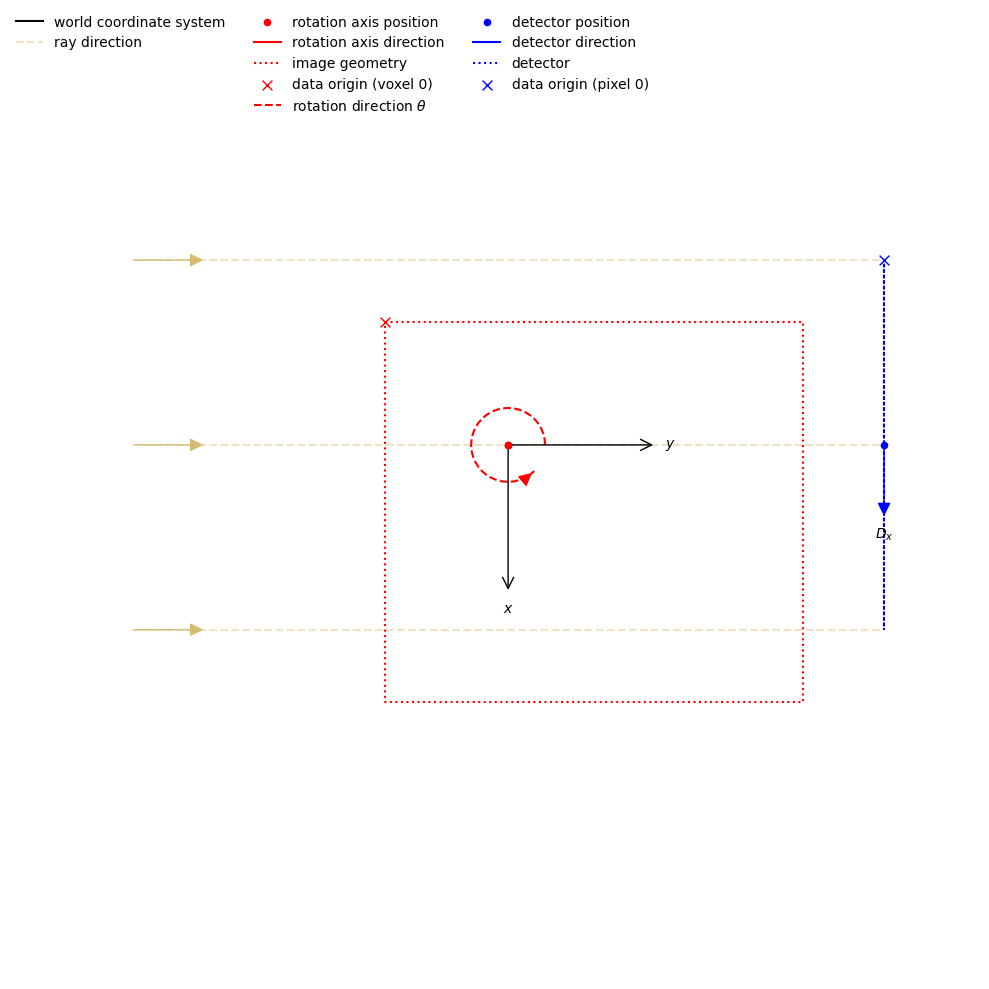

In [32]:
show_geometry(ag_pad, ig_1)

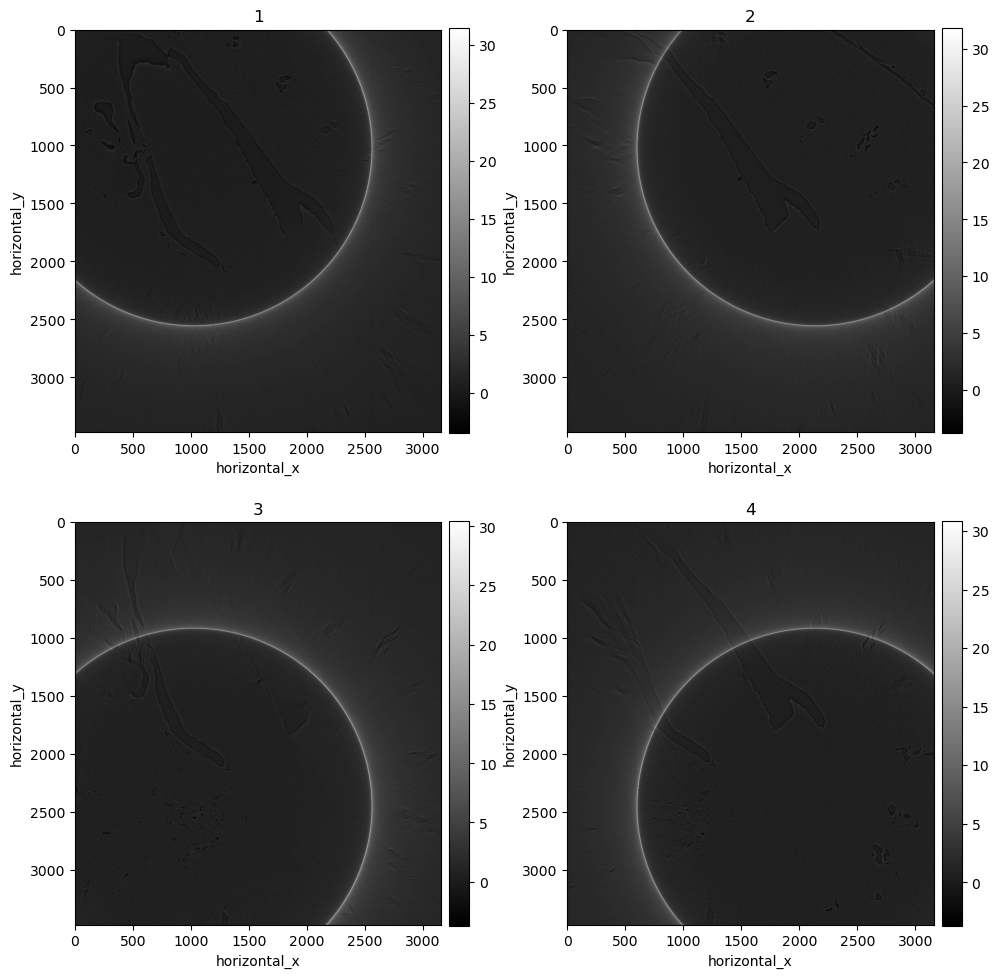

In [33]:
show2D([recon_fbp_1, recon_fbp_3, recon_fbp_2, recon_fbp_4], ['1', '2', '3', '4'], \
       cmap='gray', num_cols=2, size=(10,10), origin='upper-left')

In [34]:
ag_pad = AcquisitionGeometry.create_Parallel2D(detector_position=[0,5])  \
         .set_panel(3072, pixel_size=0.0016)      \
         .set_angles(angles=np.linspace(0,180,1800,endpoint=False))

fbp = FBP(ig_2048, ag_pad, device)
recon_fbp_1 = fbp(data_pad_1)
fbp = FBP(ig_2048, ag_pad, device)
recon_fbp_2 = fbp(data_pad_2)
fbp = FBP(ig_2048, ag_pad, device)
recon_fbp_3 = fbp(sino_3_pad)
fbp = FBP(ig_2048, ag_pad, device)
recon_fbp_4 = fbp(sino_4_pad)

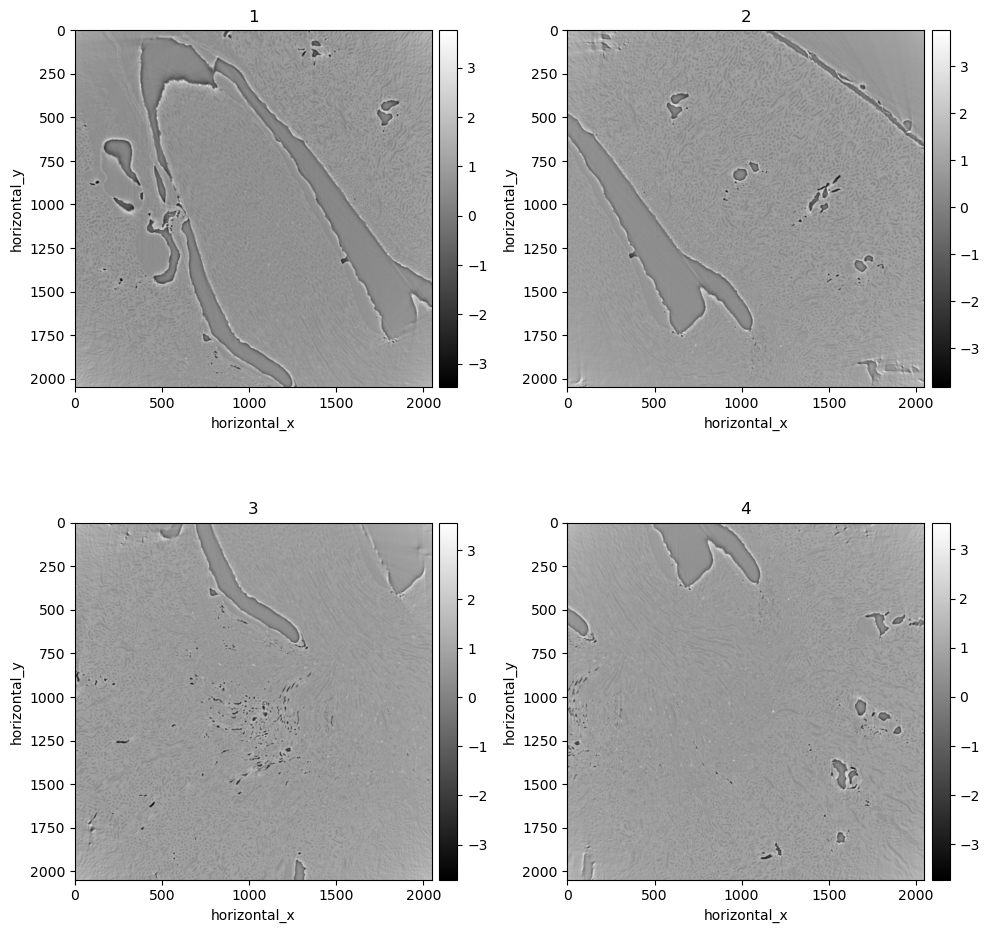

In [35]:
show2D([recon_fbp_1, recon_fbp_3, recon_fbp_2, recon_fbp_4], ['1', '2', '3', '4'], \
       cmap='gray', num_cols=2, size=(10,10), origin='upper-left')

# Data blocking

In [36]:
# CIL optimisation algorithms and linear operators
from cil.optimisation.algorithms import CGLS
from cil.optimisation.operators import BlockOperator, GradientOperator, IdentityOperator, FiniteDifferenceOperator
from cil.framework import BlockDataContainer

In [37]:
# Angles
angles = np.linspace(0, 180, 1800, endpoint=False, dtype=np.float32)

# OFFSET AXIS X : 555.25*0.0016 = 0.8884   Y : 711.5*0.0016 = 1.1384

#number of pixels
pixel_size = 0.0016 #mm
n_pixels_X = 3158.5
n_pixels_Y = 3471
n_pixels_detector = 2048



ig = ImageGeometry(voxel_num_x=3158.5, 
                   voxel_num_y=3471, 
                   voxel_size_x=0.0016, 
                   voxel_size_y=0.0016)

ig_pad = ImageGeometry(voxel_num_x=4182.5, 
                   voxel_num_y=4495, 
                   voxel_size_x=0.0016, 
                   voxel_size_y=0.0016)

ig_2048 = ImageGeometry(voxel_num_x=2048, 
                   voxel_num_y=2048, 
                   voxel_size_x=0.0016, 
                   voxel_size_y=0.0016)

ig_1 = ImageGeometry(voxel_num_x = 3158.5,
                     voxel_num_y = 3471,
                     voxel_size_x = 0.0016,
                     voxel_size_y = 0.0016,
                     center_x = 555.25 * ig.voxel_size_x,
                     center_y = 711.5 * ig.voxel_size_y)

ig_2 = ImageGeometry(voxel_num_x = 3158.5,
                     voxel_num_y = 3471,
                     voxel_size_x = 0.0016,
                     voxel_size_y = 0.0016,
                     center_x = 555.25 * ig.voxel_size_x,
                     center_y = -711.5 * ig.voxel_size_y)

ig_3 = ImageGeometry(voxel_num_x = 3158.5,
                     voxel_num_y = 3471,
                     voxel_size_x = 0.0016,
                     voxel_size_y = 0.0016,
                     center_x = -555.25 * ig.voxel_size_x,
                     center_y = 711.5 * ig.voxel_size_y)

ig_4 = ImageGeometry(voxel_num_x = 3158.5,
                     voxel_num_y = 3471,
                     voxel_size_x = 0.0016,
                     voxel_size_y = 0.0016,
                     center_x = -555.25 * ig.voxel_size_x,
                     center_y = -711.5 * ig.voxel_size_y)

ig_1_pad = ImageGeometry(voxel_num_x = 4182.5,
                     voxel_num_y = 4495,
                     voxel_size_x = 0.0016,
                     voxel_size_y = 0.0016,
                     center_x = 555.25 * ig.voxel_size_x,
                     center_y = 711.5 * ig.voxel_size_y)

ig_2_pad = ImageGeometry(voxel_num_x = 4182.5,
                     voxel_num_y = 4495,
                     voxel_size_x = 0.0016,
                     voxel_size_y = 0.0016,
                     center_x = 555.25 * ig.voxel_size_x,
                     center_y = -711.5 * ig.voxel_size_y)

ig_3_pad = ImageGeometry(voxel_num_x = 4182.5,
                     voxel_num_y = 4495,
                     voxel_size_x = 0.0016,
                     voxel_size_y = 0.0016,
                     center_x = -555.25 * ig.voxel_size_x,
                     center_y = 711.5 * ig.voxel_size_y)

ig_4_pad = ImageGeometry(voxel_num_x = 4182.5,
                     voxel_num_y = 4495,
                     voxel_size_x = 0.0016,
                     voxel_size_y = 0.0016,
                     center_x = -555.25 * ig.voxel_size_x,
                     center_y = -711.5 * ig.voxel_size_y)


ag = AcquisitionGeometry.create_Parallel2D(detector_position=[0,5])  \
         .set_panel(2048, pixel_size=0.0016)      \
         .set_angles(angles=np.linspace(0,180,1800,endpoint=False))

ag_1 = AcquisitionGeometry.create_Parallel2D(detector_position=[0.8884,7],
                                             rotation_axis_position=[0.8884,1.1384])\
                                             .set_angles(angles)\
                                             .set_panel(2048, pixel_size=0.0016)

ag_2 = AcquisitionGeometry.create_Parallel2D(detector_position=[0.8884,7],
                                             rotation_axis_position=[0.8884,-1.1384])\
                                             .set_angles(angles)\
                                             .set_panel(2048, pixel_size=0.0016)

ag_3 = AcquisitionGeometry.create_Parallel2D(detector_position=[-0.8884,7],
                                             rotation_axis_position=[-0.8884,1.1384])\
                                             .set_angles(angles)\
                                             .set_panel(2048, pixel_size=0.0016)

ag_4 = AcquisitionGeometry.create_Parallel2D(detector_position=[-0.8884,7],
                                             rotation_axis_position=[-0.8884,-1.1384])\
                                             .set_angles(angles)\
                                             .set_panel(2048, pixel_size=0.0016)

ag_pad = AcquisitionGeometry.create_Parallel2D(detector_position=[0,5])  \
         .set_panel(3072, pixel_size=0.0016)      \
         .set_angles(angles=np.linspace(0,180,1800,endpoint=False))


ag_1_pad = AcquisitionGeometry.create_Parallel2D(detector_position=[0,5],
                                             rotation_axis_position=[0.8884,1.1384])\
                                             .set_angles(angles)\
                                             .set_panel(3072, pixel_size=0.0016)

ag_2_pad = AcquisitionGeometry.create_Parallel2D(detector_position=[0,5],
                                             rotation_axis_position=[0.8884,-1.1384])\
                                             .set_angles(angles)\
                                             .set_panel(3072, pixel_size=0.0016)

ag_3_pad = AcquisitionGeometry.create_Parallel2D(detector_position=[0,5],
                                             rotation_axis_position=[-0.8884,1.1384])\
                                             .set_angles(angles)\
                                             .set_panel(3072, pixel_size=0.0016)

ag_4_pad = AcquisitionGeometry.create_Parallel2D(detector_position=[0,5],
                                             rotation_axis_position=[-0.8884,-1.1384])\
                                             .set_angles(angles)\
                                             .set_panel(3072, pixel_size=0.0016)

In [38]:
A1 = ProjectionOperator(ig_1, ag, device)
A2 = ProjectionOperator(ig_2, ag, device)
A3 = ProjectionOperator(ig_3, ag, device)
A4 = ProjectionOperator(ig_4, ag, device)

In [39]:
A_big = BlockOperator(A1, A2, A3, A4)

In [40]:
b1 = data_1
b2 = data_2
b3 = data_3
b4 = data_4

In [41]:
b_big = BlockDataContainer(b1, b2, b3, b4)

In [42]:
# initial estimate - zero array in this case 
initial = ig.allocate(0)

# setup CGLS
cgls = CGLS(initial=initial, 
            operator=A_big, 
            data=b_big,
            max_iteration = 100,
            update_objective_interval = 1 )

In [43]:
# run N interations
cgls.run(10, verbose=True)

     Iter   Max Iter     Time/Iter            Objective
                               [s]                     
        0        100         0.000          2.68400e+08
        1        100         2.948          1.73954e+07
        2        100         2.941          6.64217e+06
        3        100         2.940          4.70706e+06
        4        100         2.940          4.02531e+06
        5        100         2.939          3.17952e+06
        6        100         2.938          3.02204e+06
        7        100         2.937          2.66410e+06
        8        100         2.937          2.43424e+06
        9        100         2.937          2.22695e+06
       10        100         2.937          2.06138e+06
-------------------------------------------------------
       10        100         2.937          2.06138e+06
Stop criterion has been reached.



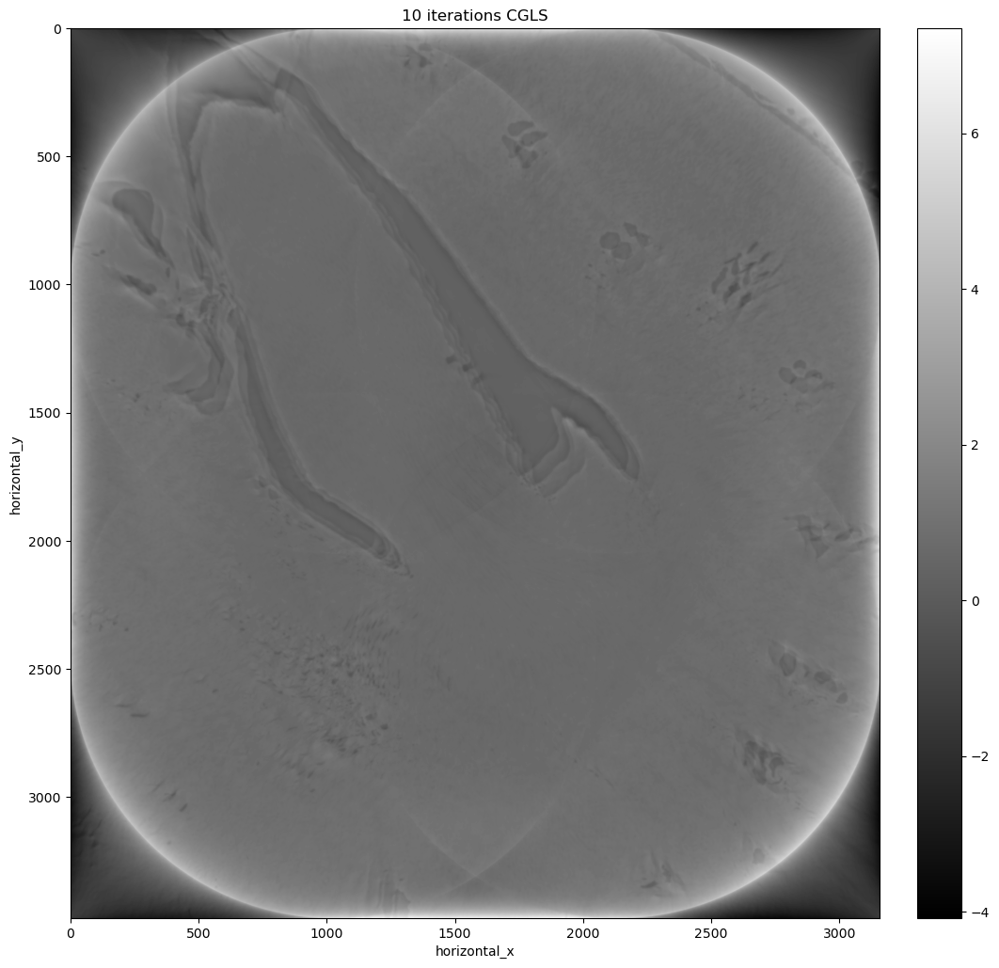

Saved image as /dtu/cfu/home/s220464/Code/Phase3/missaligned_block.png


<Figure size 640x480 with 0 Axes>

In [44]:
# get and visualise the results
recon_cgls = cgls.solution

show2D([recon_cgls], ['10 iterations CGLS'], \
       cmap='gray', num_cols=1, size=(20,20), origin='upper-left').save('missaligned_block.png')

In [45]:
import os
from cil.io import TIFFWriter

save_base_path = '/dtu/cfu/data/userdata18/s220464/storage/PHASE_3'
save_path = os.path.join(save_base_path, 'missaligned.tiff')
TIFFWriter(data=recon_cgls, file_name=save_path).write()

# Correcting misalignment

In [46]:
# here ig_1 should have the size of an entire thing. or should it? yes because we scan entire thing and produce small 2048x2048 images
ig_1 = ImageGeometry(voxel_num_x = 3158.5,
                     voxel_num_y = 3471,
                     voxel_size_x = 0.0016,
                     voxel_size_y = 0.0016,
                     center_x = 555 * ig.voxel_size_x,
                     center_y = 735 * ig.voxel_size_y)

ig_2 = ImageGeometry(voxel_num_x = 3158.5,
                     voxel_num_y = 3471,
                     voxel_size_x = 0.0016,
                     voxel_size_y = 0.0016,
                     center_x = 590 * ig.voxel_size_x,
                     center_y = -640 * ig.voxel_size_y)

ig_3 = ImageGeometry(voxel_num_x = 3158.5,
                     voxel_num_y = 3471,
                     voxel_size_x = 0.0016,
                     voxel_size_y = 0.0016,
                     center_x = -610 * ig.voxel_size_x,
                     center_y = 702* ig.voxel_size_y)

ig_4 = ImageGeometry(voxel_num_x = 3158.5,
                     voxel_num_y = 3471,
                     voxel_size_x = 0.0016,
                     voxel_size_y = 0.0016,
                     center_x = -570 * ig.voxel_size_x,
                     center_y = -680 * ig.voxel_size_y)# can i simply extend ag length?

In [47]:
A1 = ProjectionOperator(ig_1, ag, device)
A2 = ProjectionOperator(ig_2, ag, device)
A3 = ProjectionOperator(ig_3, ag, device)
A4 = ProjectionOperator(ig_4, ag, device)

In [48]:
A_big = BlockOperator(A1, A2, A3, A4)

In [49]:
#A_big = BlockOperator(A1, A3)

In [50]:
b1 = data_1
b2 = data_2
b3 = data_3
b4 = data_4

In [51]:
b_big = BlockDataContainer(b1, b2, b3, b4)

In [52]:
#b_big = BlockDataContainer(b1, b3)

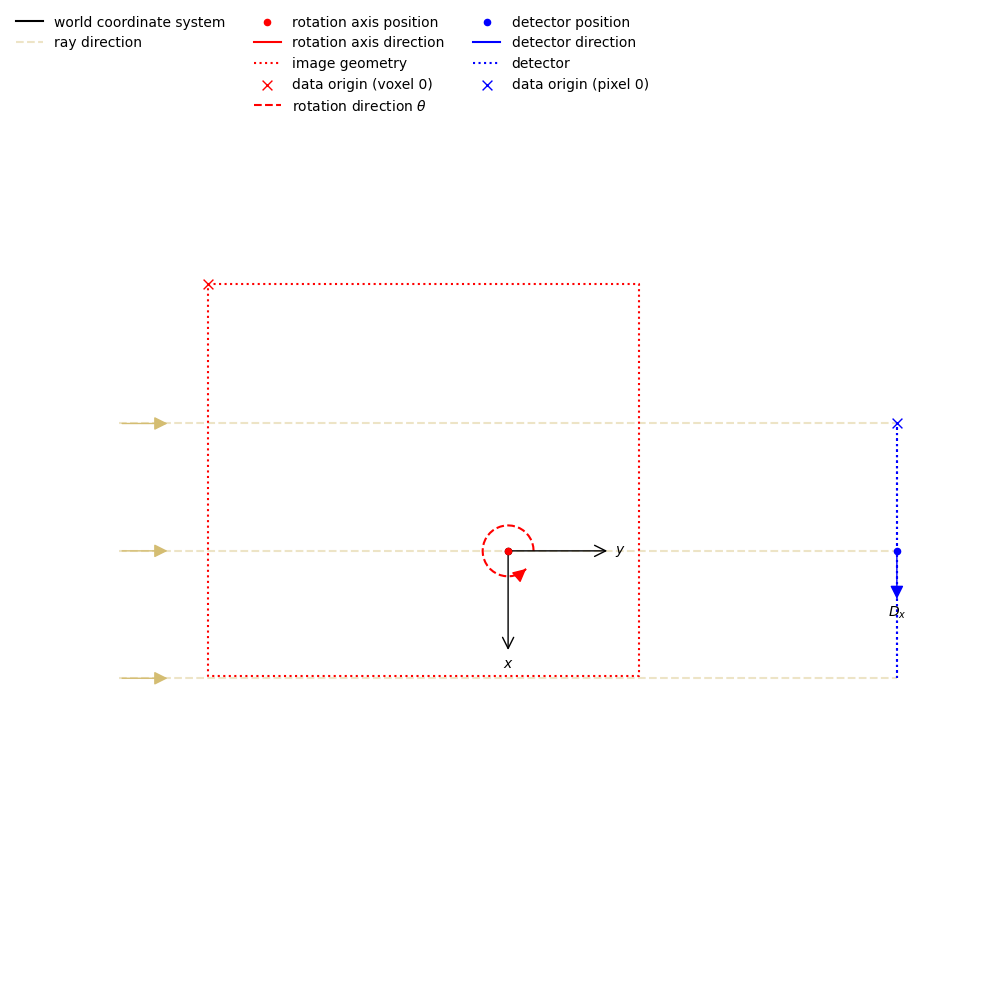

In [53]:
show_geometry(ag, ig_4)

In [54]:
# initial estimate - zero array in this case 
initial = ig.allocate(0)

# setup CGLS
cgls = CGLS(initial=initial, 
            operator=A_big, 
            data=b_big,
            max_iteration = 100,
            update_objective_interval = 1 )

In [55]:
# run N interations
cgls.run(10, verbose=True)

     Iter   Max Iter     Time/Iter            Objective
                               [s]                     
        0        100         0.000          2.68400e+08
        1        100         2.845          1.76731e+07
        2        100         2.843          6.91085e+06
        3        100         2.843          4.97324e+06
        4        100         2.842          4.29881e+06
        5        100         2.843          3.48335e+06
        6        100         2.848          3.28329e+06
        7        100         2.847          3.02349e+06
        8        100         2.847          2.82790e+06
        9        100         2.846          2.65620e+06
       10        100         2.846          2.51839e+06
-------------------------------------------------------
       10        100         2.846          2.51839e+06
Stop criterion has been reached.



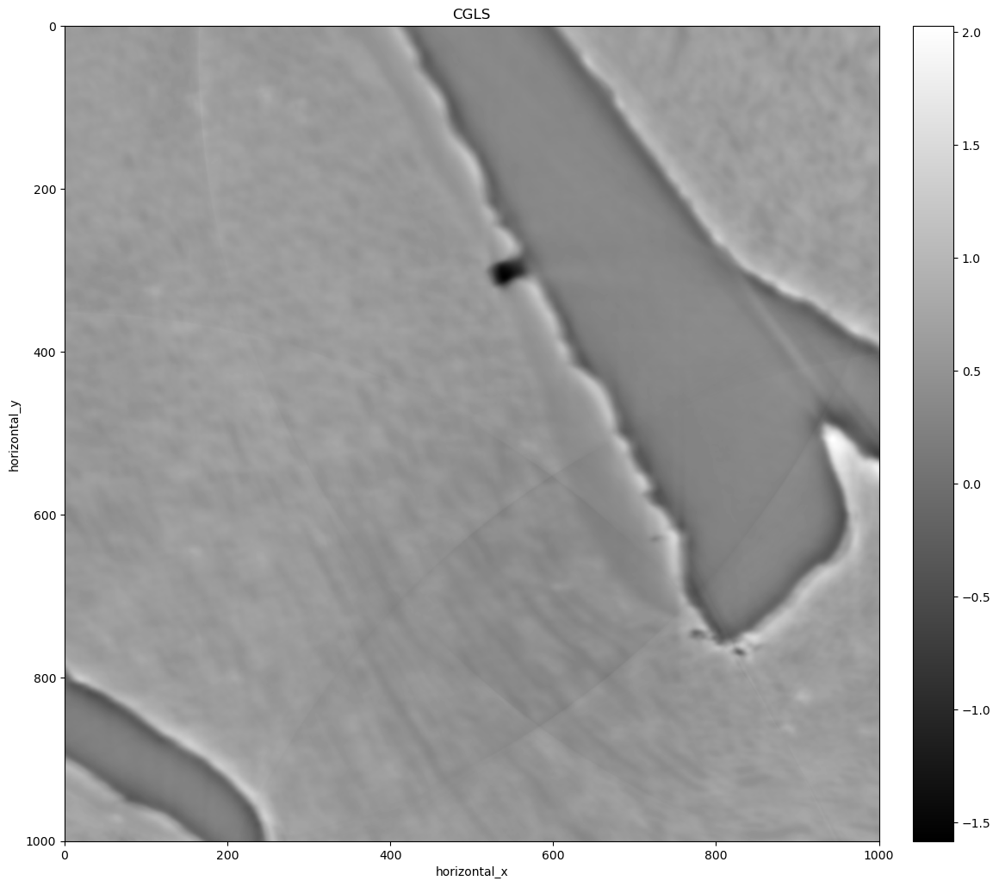

In [56]:
im_crop = Slicer(roi={'horizontal_y':(1000,2000,1),
                     'horizontal_x':(1000,2000,1)})(cgls.solution)

show2D([im_crop], ['CGLS'], \
       cmap='gray', num_cols=1, size=(20,20), origin='upper-left')

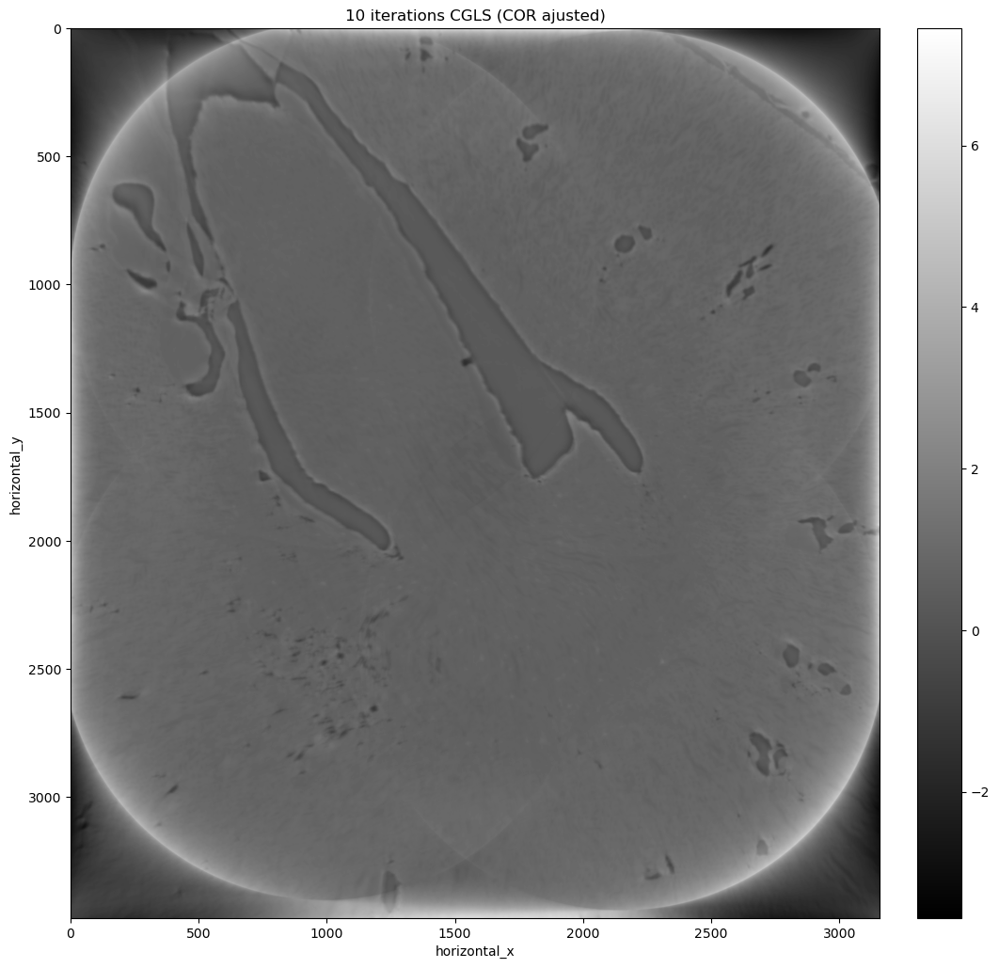

Saved image as /dtu/cfu/home/s220464/Code/Phase3/missalined_cor_block.png


<Figure size 640x480 with 0 Axes>

In [57]:
# get and visualise the results
recon_cgls = cgls.solution

show2D([recon_cgls], ['10 iterations CGLS (COR ajusted)'], \
       cmap='gray', num_cols=1, size=(20,20), origin='upper-left').save('missalined_cor_block.png')

In [58]:
save_base_path = '/dtu/cfu/data/userdata18/s220464/storage/PHASE_3'
save_path = os.path.join(save_base_path, 'missaligned_corr.tiff')
TIFFWriter(data=recon_cgls, file_name=save_path).write()

In [ ]:
show_geometry(ag, ig_4)

In [59]:
# run N interations
cgls.run(10, verbose=True)

     Iter   Max Iter     Time/Iter            Objective
                               [s]                     
       10        100         2.846          2.51839e+06
       11        100         2.850          2.43824e+06
       12        100         2.853          2.37085e+06
       13        100         2.855          2.35064e+06
       14        100         2.857          2.28113e+06
       15        100         2.859          2.23672e+06
       16        100         2.860          2.20349e+06
       17        100         2.862          2.15930e+06
       18        100         2.862          2.13818e+06
       19        100         2.863          2.12243e+06
       20        100         2.863          2.09710e+06
-------------------------------------------------------
       20        100         2.863          2.09710e+06
Stop criterion has been reached.



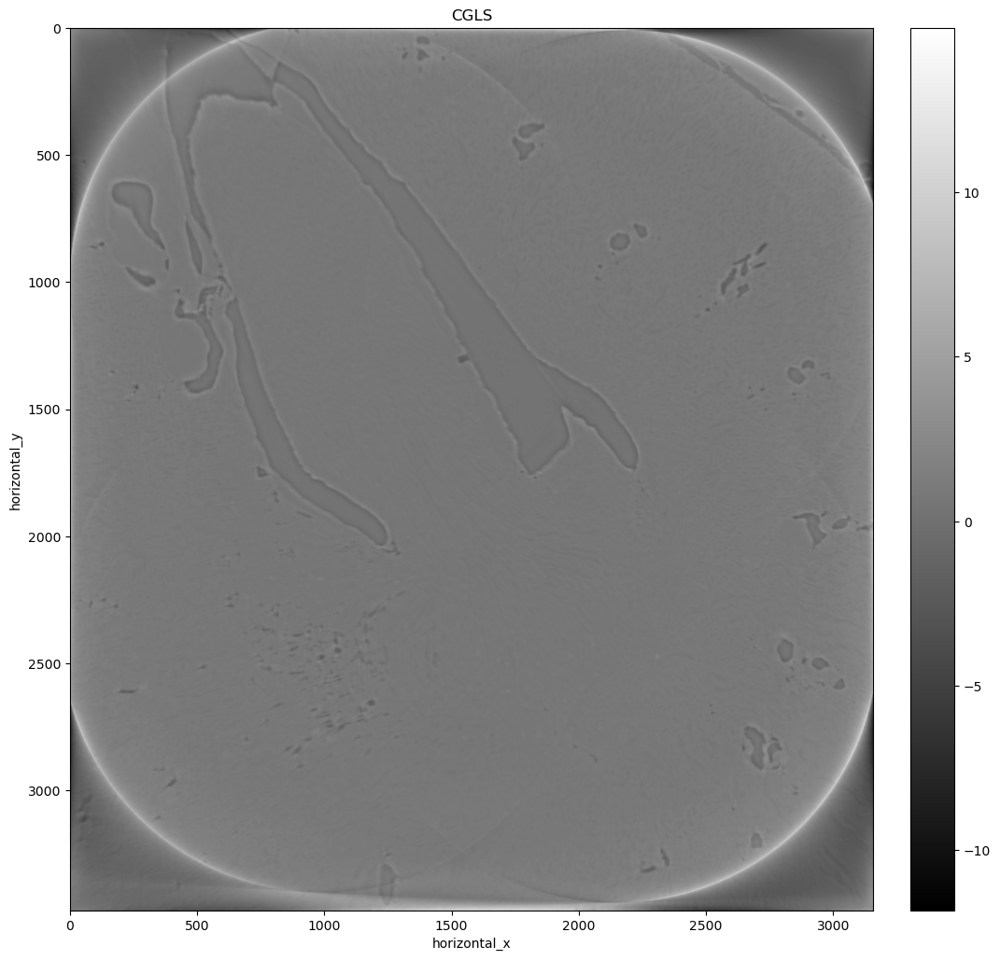

In [60]:
# get and visualise the results
recon_cgls = cgls.solution

show2D([recon_cgls], ['CGLS'], \
       cmap='gray', num_cols=1, size=(20,20), origin='upper-left')

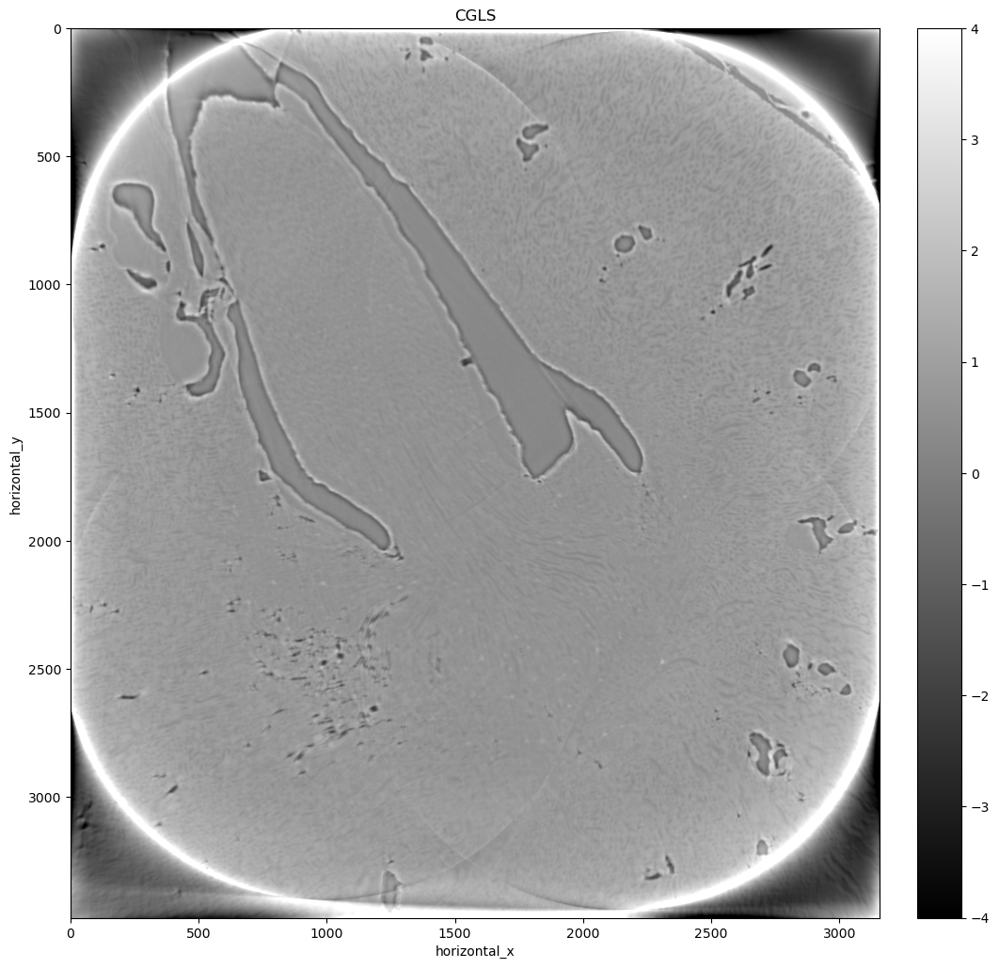

In [61]:
# get and visualise the results
recon_cgls = cgls.solution

show2D([recon_cgls], ['CGLS'], \
       cmap='gray', fix_range = (-4, 4), num_cols=1, size=(20,20), origin='upper-left')

In [62]:
save_base_path = '/dtu/cfu/data/userdata18/s220464/storage/PHASE_3'
save_path = os.path.join(save_base_path, 'phase3_final.tiff')
TIFFWriter(data=recon_cgls, file_name=save_path).write()

In [63]:
# run N interations
cgls.run(10, verbose=True)

     Iter   Max Iter     Time/Iter            Objective
                               [s]                     
       20        100         2.863          2.09710e+06
       21        100         2.867          2.07239e+06
       22        100         2.870          2.05053e+06
       23        100         2.873          2.03436e+06
       24        100         2.876          2.03054e+06
       25        100         2.878          2.02220e+06
       26        100         2.880          2.00981e+06
       27        100         2.882          2.00010e+06
       28        100         2.883          1.98833e+06
       29        100         2.885          1.98189e+06
       30        100         2.889          1.97826e+06
-------------------------------------------------------
       30        100         2.889          1.97826e+06
Stop criterion has been reached.



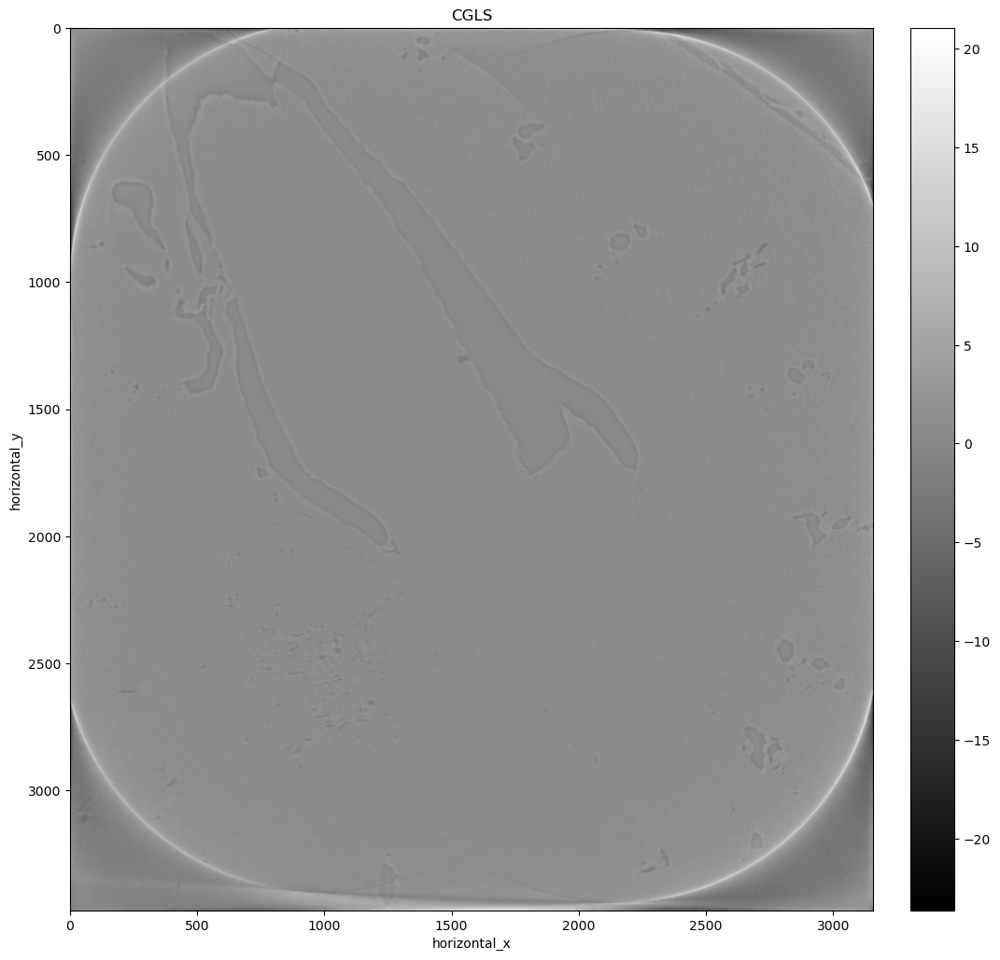

In [64]:
# get and visualise the results
recon_cgls = cgls.solution

show2D([recon_cgls], ['CGLS'], \
       cmap='gray', num_cols=1, size=(20,20), origin='upper-left')

# Rconstructing with padded data 

In [65]:
ig_1_pad = ImageGeometry(voxel_num_x = 4182.5,
                     voxel_num_y = 4495,
                     voxel_size_x = 0.0016,
                     voxel_size_y = 0.0016,
                     center_x = 555.25 * ig.voxel_size_x,
                     center_y = 711.5 * ig.voxel_size_y)

ig_2_pad = ImageGeometry(voxel_num_x = 4182.5,
                     voxel_num_y = 4495,
                     voxel_size_x = 0.0016,
                     voxel_size_y = 0.0016,
                     center_x = 555.25 * ig.voxel_size_x,
                     center_y = -711.5 * ig.voxel_size_y)

ig_3_pad = ImageGeometry(voxel_num_x = 4182.5,
                     voxel_num_y = 4495,
                     voxel_size_x = 0.0016,
                     voxel_size_y = 0.0016,
                     center_x = -555.25 * ig.voxel_size_x,
                     center_y = 711.5 * ig.voxel_size_y)

ig_4_pad = ImageGeometry(voxel_num_x = 4182.5,
                     voxel_num_y = 4495,
                     voxel_size_x = 0.0016,
                     voxel_size_y = 0.0016,
                     center_x = -555.25 * ig.voxel_size_x,
                     center_y = -711.5 * ig.voxel_size_y)# can i simply extend ag length?







ag_pad = AcquisitionGeometry.create_Parallel2D(detector_position=[0,5])  \
         .set_panel(3072, pixel_size=0.0016)      \
         .set_angles(angles=np.linspace(0,180,1800,endpoint=False))




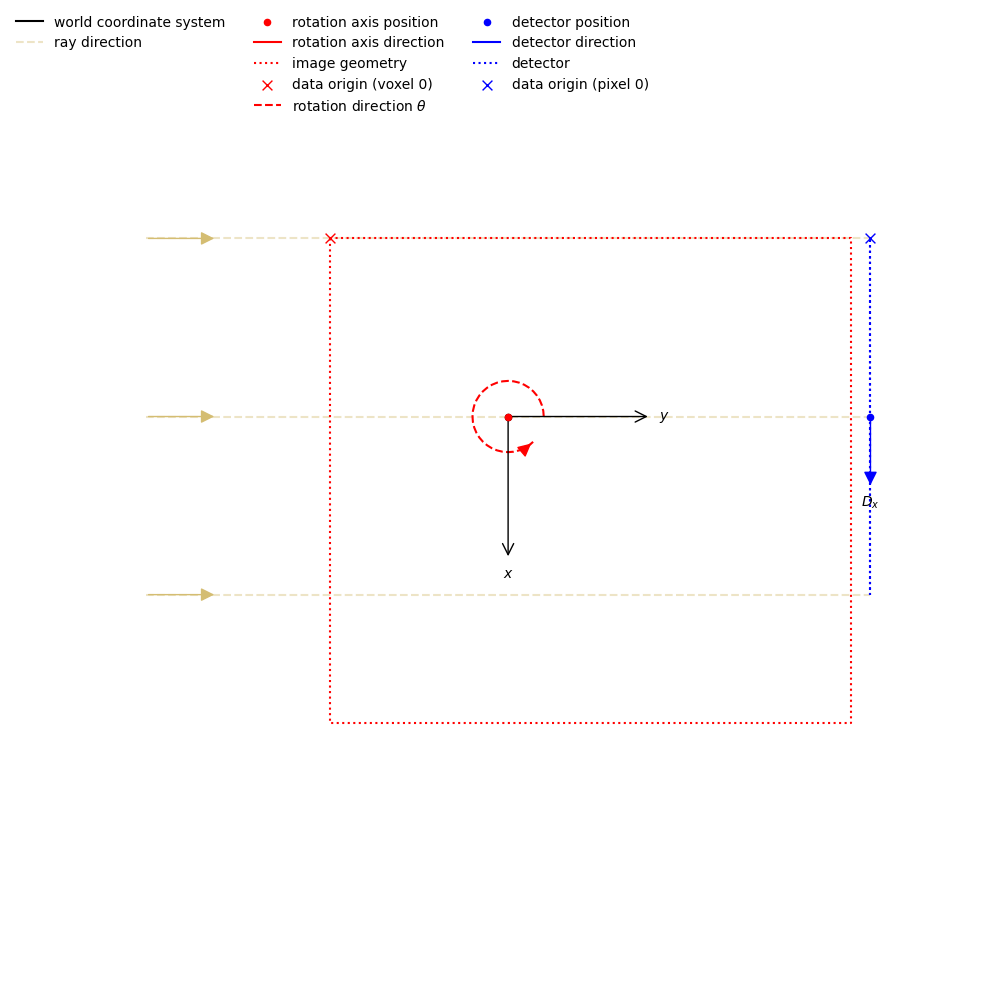

In [66]:
show_geometry(ag_pad, ig_1_pad)

In [67]:
A1 = ProjectionOperator(ig_1_pad, ag_pad, device)
A2 = ProjectionOperator(ig_2_pad, ag_pad, device)
A3 = ProjectionOperator(ig_3_pad, ag_pad, device)
A4 = ProjectionOperator(ig_4_pad, ag_pad, device)

In [68]:
A_big = BlockOperator(A1, A2, A3, A4)

In [69]:
b1 = sino_1_pad
b2 = sino_2_pad
b3 = sino_3_pad
b4 = sino_4_pad

In [70]:
sino_4_pad.shape

(1800, 3072)

In [71]:
ig_pad.shape

(4495, 4182)

In [72]:
b_big = BlockDataContainer(b1, b2, b3, b4)

In [73]:
# initial estimate - zero array in this case 
initial = ig_pad.allocate(0)

# setup CGLS
cgls = CGLS(initial=initial, 
            operator=A_big, 
            data=b_big,
            max_iteration = 100,
            update_objective_interval = 1 )

In [74]:
# run N interations
cgls.run(20, verbose=True)

     Iter   Max Iter     Time/Iter            Objective
                               [s]                     
        0        100         0.000          3.97340e+08
        1        100         4.921          2.13650e+07
        2        100         4.889          7.23589e+06
        3        100         4.878          5.17280e+06
        4        100         4.872          4.24673e+06
        5        100         4.869          3.30482e+06
        6        100         4.867          2.95594e+06
        7        100         4.866          2.79249e+06
        8        100         4.864          2.47571e+06
        9        100         4.867          2.30368e+06
       10        100         4.866          2.12102e+06
       11        100         4.865          1.98549e+06
       12        100         4.864          1.94974e+06
       13        100         4.863          1.82096e+06
       14        100         4.863          1.73312e+06
       15        100         4.863          1.67

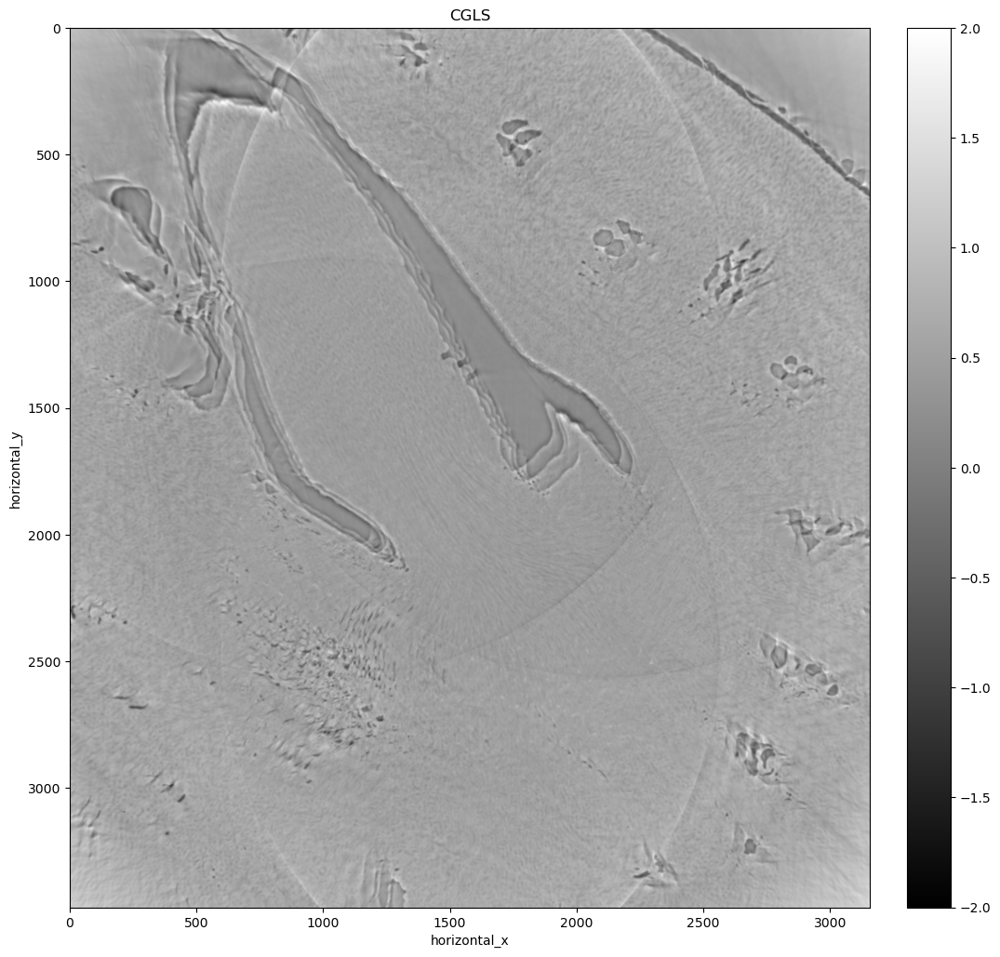

In [75]:
im_crop = Slicer(roi={'horizontal_x':(512,3670.5,1),
                     'horizontal_y':(512,3983,1)})(cgls.solution)

show2D([im_crop], ['CGLS'], \
       cmap='gray', fix_range=(-2,2), num_cols=1, size=(20,20), origin='upper-left')

# Padding with corrected igs

In [76]:
ig_1_pad = ImageGeometry(voxel_num_x = 4182.5,
                     voxel_num_y = 4495,
                     voxel_size_x = 0.0016,
                     voxel_size_y = 0.0016,
                     center_x = 555 * ig.voxel_size_x,
                     center_y = 735 * ig.voxel_size_y)

ig_2_pad = ImageGeometry(voxel_num_x = 4182.5,
                     voxel_num_y = 4495,
                     voxel_size_x = 0.0016,
                     voxel_size_y = 0.0016,
                     center_x = 590 * ig.voxel_size_x,
                     center_y = -640 * ig.voxel_size_y)

ig_3_pad = ImageGeometry(voxel_num_x = 4182.5,
                     voxel_num_y = 4495,
                     voxel_size_x = 0.0016,
                     voxel_size_y = 0.0016,
                     center_x = -610 * ig.voxel_size_x,
                     center_y = 702* ig.voxel_size_y)

ig_4_pad = ImageGeometry(voxel_num_x = 4182.5,
                     voxel_num_y = 4495,
                     voxel_size_x = 0.0016,
                     voxel_size_y = 0.0016,
                     center_x = -570 * ig.voxel_size_x,
                     center_y = -680 * ig.voxel_size_y)# can i simply extend ag length?




In [77]:
A1 = ProjectionOperator(ig_1_pad, ag_pad, device)
A2 = ProjectionOperator(ig_2_pad, ag_pad, device)
A3 = ProjectionOperator(ig_3_pad, ag_pad, device)
A4 = ProjectionOperator(ig_4_pad, ag_pad, device)

In [78]:
A_big = BlockOperator(A1, A2, A3, A4)

In [79]:
b1 = sino_1_pad
b2 = sino_2_pad
b3 = sino_3_pad
b4 = sino_4_pad

In [80]:
sino_4_pad.shape

(1800, 3072)

In [81]:
ig_pad.shape

(4495, 4182)

In [82]:
b_big = BlockDataContainer(b1, b2, b3, b4)

In [88]:
# initial estimate - zero array in this case 
initial = ig_pad.allocate(0)

# setup CGLS
cgls = CGLS(initial=initial, 
            operator=A_big, 
            data=b_big,
            max_iteration = 100,
            update_objective_interval = 1 )

In [89]:
# run N interations
cgls.run(20, verbose=True)

     Iter   Max Iter     Time/Iter            Objective
                               [s]                     
        0        100         0.000          3.97340e+08
        1        100         4.825          2.15838e+07
        2        100         4.827          7.44806e+06
        3        100         4.830          5.38032e+06
        4        100         4.831          4.45699e+06
        5        100         4.830          3.51838e+06
        6        100         4.828          3.16849e+06
        7        100         4.824          3.01527e+06
        8        100         4.822          2.72705e+06
        9        100         4.820          2.54673e+06
       10        100         4.824          2.41645e+06
       11        100         4.822          2.30558e+06
       12        100         4.820          2.21065e+06
       13        100         4.819          2.17453e+06
       14        100         4.823          2.11898e+06
       15        100         4.821          2.06

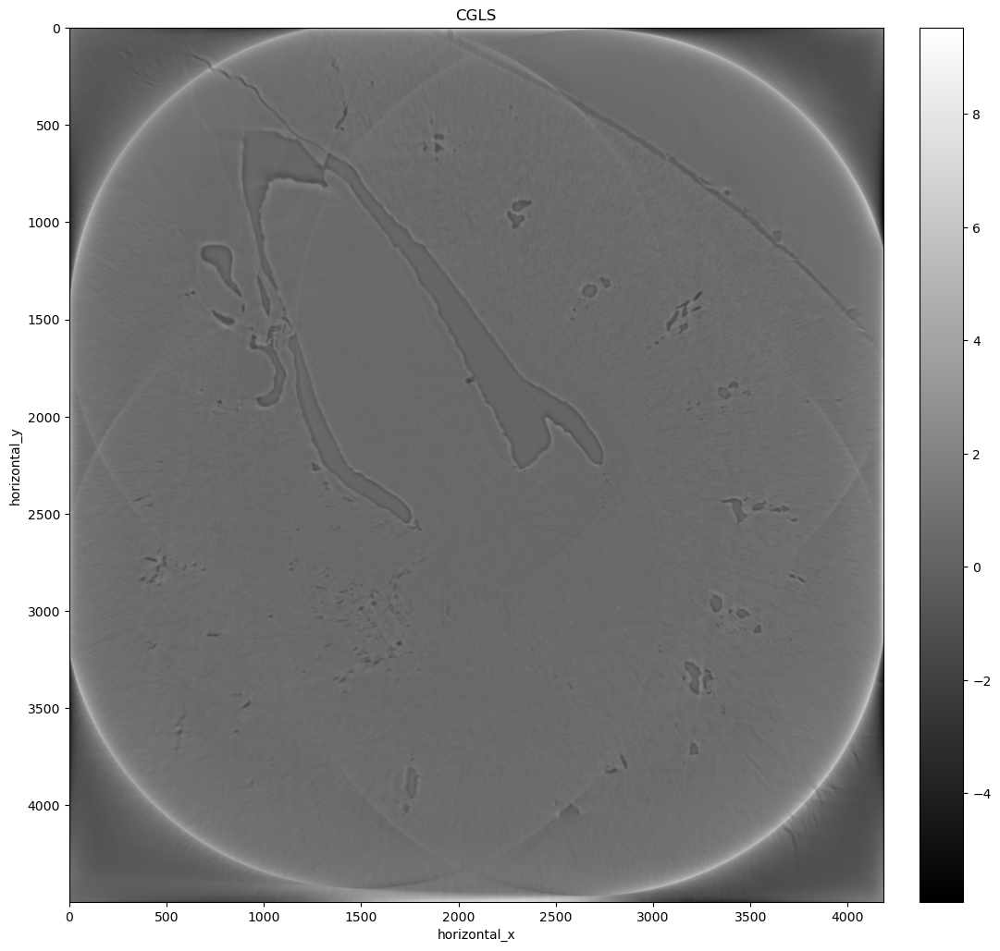

In [90]:
show2D([cgls.solution], ['CGLS'], \
       cmap='gray', num_cols=1, size=(20,20), origin='upper-left')

In [91]:
import os
from cil.io import TIFFWriter

save_base_path = '/dtu/cfu/data/userdata18/s220464/storage/PHASE_3'
save_path = os.path.join(save_base_path, 'block_pad.tiff')
TIFFWriter(data=cgls.solution, file_name=save_path).write()

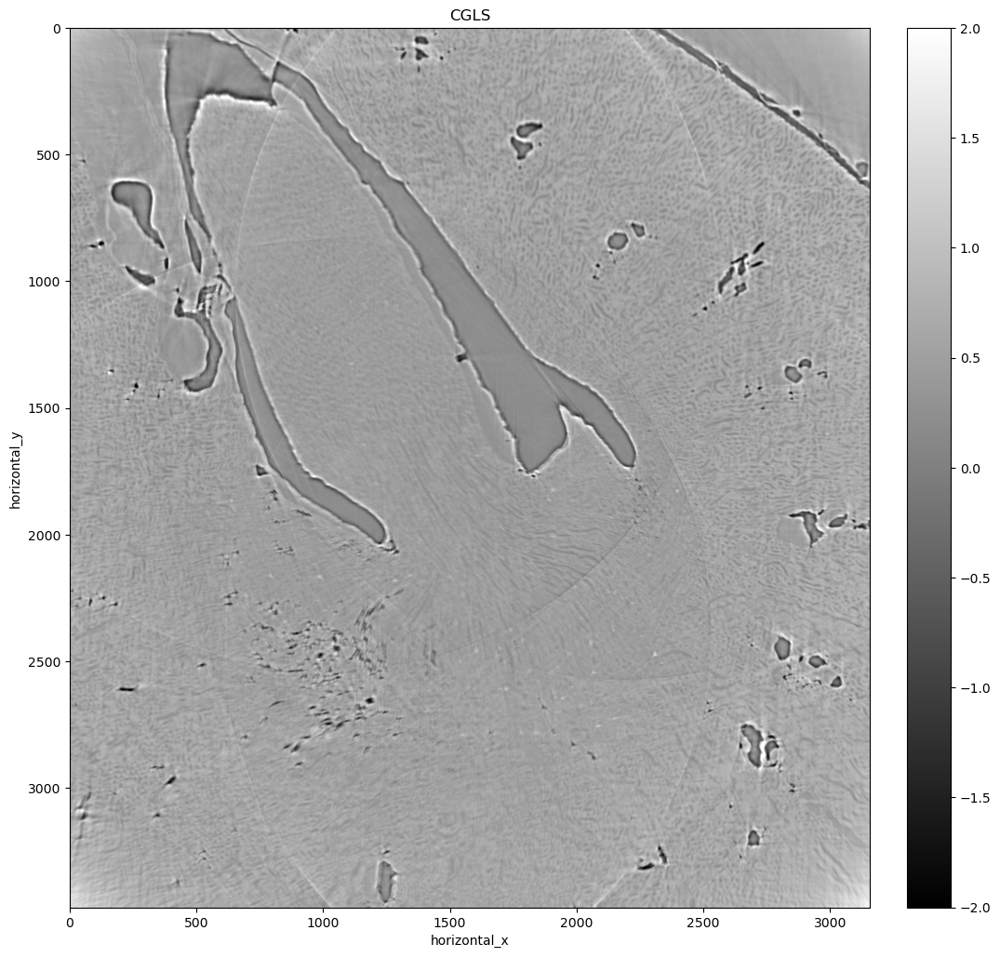

In [82]:
im_crop = Slicer(roi={'horizontal_x':(512,3670.5,1),
                     'horizontal_y':(512,3983,1)})(cgls.solution)

show2D([im_crop], ['CGLS'], \
       cmap='gray', fix_range=(-2,2), num_cols=1, size=(20,20), origin='upper-left')